# Download data and unzip! 

In [1]:
# download file and unzip! 
base_dir = "/local/ecw/redux_test"
data_path = "https://ochre.lib.uchicago.edu/deepscribe/deepscribe_2023_02_04_public.tar.gz"
!cd {base_dir} && pwd && wget {data_path} && tar -xzf deepscribe_2023_02_04_public.tar.gz

/local/ecw/redux_test
--2023-02-25 02:15:01--  https://ochre.lib.uchicago.edu/deepscribe/deepscribe_2023_02_04_public.tar.gz
Resolving ochre.lib.uchicago.edu (ochre.lib.uchicago.edu)... 128.135.181.16
Connecting to ochre.lib.uchicago.edu (ochre.lib.uchicago.edu)|128.135.181.16|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 815401491 (778M) [application/x-gzip]
Saving to: ‘deepscribe_2023_02_04_public.tar.gz.3’

deepscribe_2023_02_ 100%[===================>] 777.63M   112MB/s    in 6.9s    

2023-02-25 02:15:08 (112 MB/s) - ‘deepscribe_2023_02_04_public.tar.gz.3’ saved [815401491/815401491]



In [2]:
output_dir = "/local/ecw/redux_test/DeepScribe_Data_2023-02-04_public"

In [3]:
!ls {output_dir}

categories.txt		 data_val_cropped.json
cropped_images		 images
data_test_cropped.json	 imagesWithHotspots_cropped.json
data_train_cropped.json  imagesWithHotspots.json


In [4]:
# Example data files
import json
from torchvision.utils import draw_bounding_boxes
from torchvision.io import read_image, write_jpeg
import torch
import torchvision.transforms.functional as F
from deepscribe2.utils import get_boxes

In [5]:
with open(output_dir + "/imagesWithHotspots.json") as inf:
    all_data = json.load(inf)

In [6]:
indx = 0
entry = all_data[0]
entry

{'text_id': 'd56bd565-2caa-49fe-350a-7cc43a01b2c3',
 'image_name': 'PF 0001 Lower Edge 1, conventional, annotated',
 'file_name': '6603e2b2-7146-066d-7bde-ef212e43e08c.jpg',
 'is_published': 'true',
 'width': 1800,
 'annotations': [{'category_id': 48,
   'sign_id': '06cfebac-88b0-4476-85e6-0205356deadb',
   'bbox': [288, 301, 644, 528],
   'sign': 'UL',
   'reading': 'ul',
   'epigraphicUnit_id': '585f0438-791a-d1d4-0bd6-b0fc61e107f1',
   'reading_id': 'bac23382-7178-b5c9-5b26-765f27ad4b8c'},
  {'category_id': 38,
   'sign_id': '19076780-7e11-8cfe-7c33-50d8eb66ac51',
   'bbox': [679, 271, 843, 544],
   'sign': 'U',
   'reading': 'U',
   'epigraphicUnit_id': 'c5610daa-0902-4592-65ed-55ffff1ea508',
   'reading_id': '3662545a-9649-4a74-ab00-6be3fe1916d7'},
  {'category_id': 43,
   'sign_id': '46ac73aa-f7da-1a09-412d-0beebebf0327',
   'bbox': [858, 265, 1055, 541],
   'sign': 'ÀŠ',
   'reading': 'ÀŠ',
   'epigraphicUnit_id': '9cc58730-1dcf-2c10-b3e2-14b1decd23e4',
   'reading_id': 'f6f5438

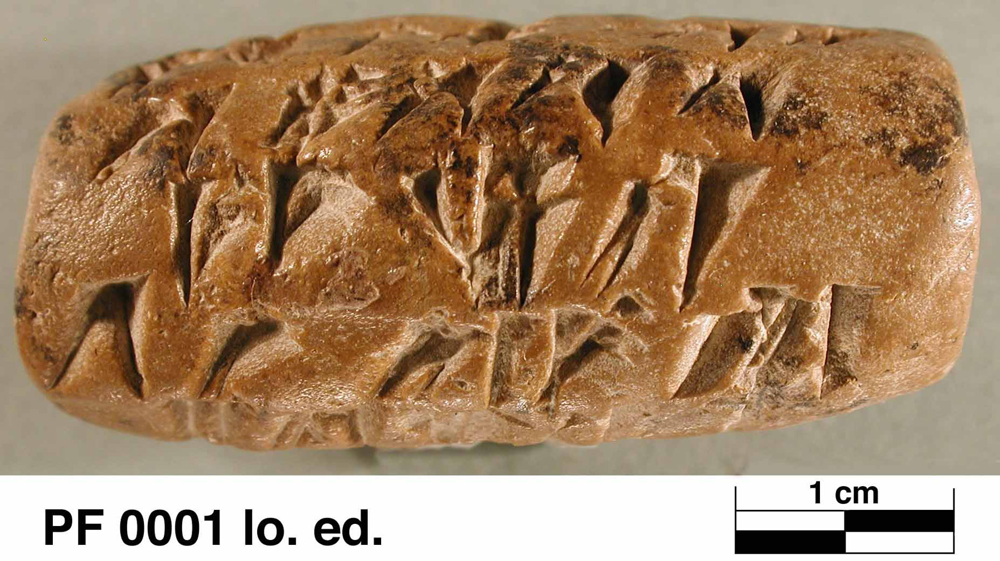

In [7]:
example_img = read_image(output_dir + "/images/" + entry["file_name"])
F.to_pil_image(example_img)

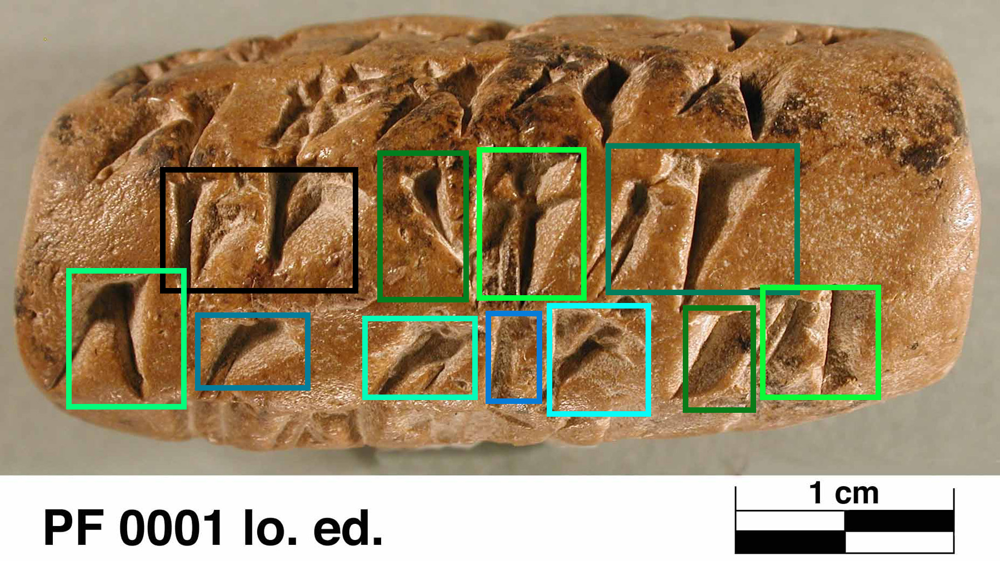

In [8]:
# now render the bounding boxes...
boxes = get_boxes(entry)
F.to_pil_image(draw_bounding_boxes(example_img, boxes, width=10))

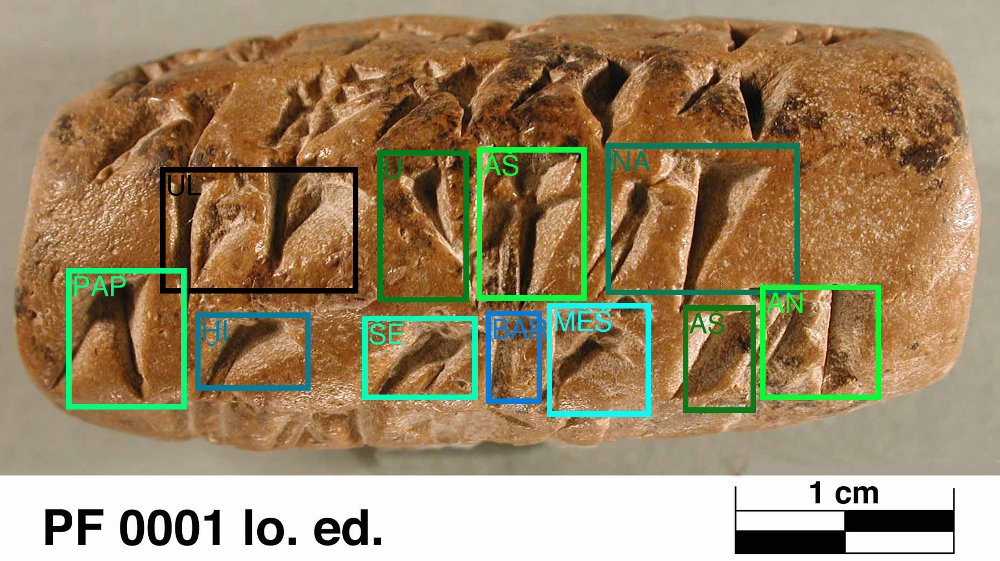

In [9]:
# draw sign classes
signs = [anno["sign"] for anno in entry["annotations"]]
boxes = get_boxes(entry)
F.to_pil_image(draw_bounding_boxes(example_img, 
                                   boxes, 
                                   width=10, 
                                   labels=signs,
                                   font="FreeSans.ttf",
                                  font_size=50))

# Object Detector Training

In [10]:
from pathlib import Path

import pytorch_lightning as pl

from deepscribe2 import transforms as ds_transforms
from deepscribe2.datasets import PFADetectionDataModule
from deepscribe2.models import RetinaNet

In [11]:
# define data augmentation!
xforms = ds_transforms.Compose(
    [
        ds_transforms.RandomHorizontalFlip(),
        ds_transforms.RandomShortestSize(
            [500, 640, 672, 704, 736, 768, 800], 1333
        ),
    ]
)


In [12]:
pfa_data_module = PFADetectionDataModule(
    output_dir,
    autocrop=True, # this will trim images using the provided boxes. 
    batch_size=4,
    train_xforms=xforms,
    localization_only=True,
)


In [13]:
model = RetinaNet(num_classes=1) # only training with localization. 

/local/ecw/mambaforge/envs/deepscribe2/lib/python3.10/site-packages/torchvision/models/detection/backbone_utils.py:160: UserWarning: Changing trainable_backbone_layers has not effect if neither pretrained nor pretrained_backbone have been set to True, falling back to trainable_backbone_layers=5 so that all layers are trainable
  warnings.warn(


In [14]:
# define callbacks.
checkpoint_callback = pl.callbacks.ModelCheckpoint(
    monitor="map_50", mode="max"
)
earlystop_callback = pl.callbacks.EarlyStopping(
    monitor="map_50", mode="max", patience=20
)


In [15]:
logger = pl.loggers.CSVLogger(f"{base_dir}/logs", name="notebook_trainer")

In [16]:
trainer = pl.Trainer(
    accelerator="gpu",
    devices=1,
    logger=logger,
    max_epochs=1000,
    callbacks=[checkpoint_callback, earlystop_callback],
)
trainer.fit(model, datamodule=pfa_data_module)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Autocrop directory found. Skipping.
Split files already exist, skipping.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                 | Params
-----------------------------------------------
0 | model | RetinaNet            | 32.2 M
1 | map   | MeanAveragePrecision | 0     
-----------------------------------------------
32.2 M    Trainable params
0         Non-trainable params
32.2 M    Total params
128.804   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [22]:
# load model stats and check performance.
!ls {base_dir}/logs/notebook_trainer/version_2/checkpoints

'epoch=358-step=88673.ckpt'


In [24]:
import pandas as pd

In [25]:
dat = pd.read_csv(f"{base_dir}/logs/notebook_trainer/version_2/metrics.csv")

<AxesSubplot: xlabel='epoch'>

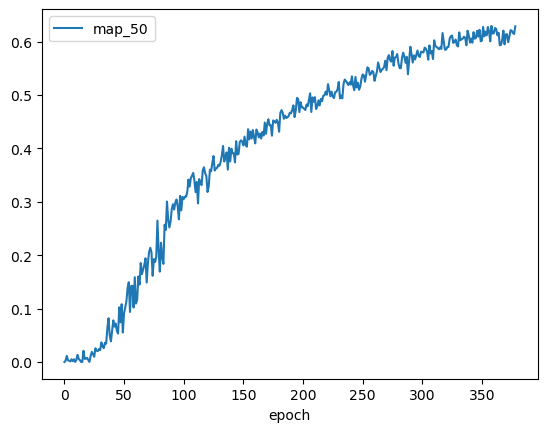

In [28]:
# get out test data only
dat.dropna(subset=["map_50"]).plot("epoch", "map_50")

In [ ]:
# run inference with detector! 

# Train classifier! 


In [29]:
from torchvision import transforms as T

from deepscribe2.datasets import PFAClassificationDataModule
from deepscribe2.models.classification import ImageClassifier

In [30]:
train_xforms = [
    T.RandomAffine(0, translate=(0.2, 0.2)),
    T.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.5),
    T.RandomPerspective(),
]

classification_datamodule = PFAClassificationDataModule(
    output_dir, batch_size=512, hotspot_size=(50, 50), train_xforms=train_xforms
)

In [31]:
classification_model = ImageClassifier(classification_datamodule.num_labels)


In [34]:
checkpoint_callback_cls = pl.callbacks.ModelCheckpoint(
    monitor="val_loss", mode="min"
)
earlystop_callback_cls = pl.callbacks.EarlyStopping(
    monitor="val_loss", mode="min", patience=20
)
logger = pl.loggers.CSVLogger(f"{base_dir}/logs", name="notebook_classifier")

In [38]:
trainer_cls = pl.Trainer(
    accelerator="gpu",
    devices=1,
    logger=logger,
    max_epochs=100,
    callbacks=[checkpoint_callback_cls, earlystop_callback_cls],
    log_every_n_steps=25
)
trainer_cls.fit(classification_model, datamodule=classification_datamodule)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Hotspots have already been made for this dataset. Skipping.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type             | Params
-----------------------------------------------------
0 | model           | ResNet           | 23.8 M
1 | loss            | CrossEntropyLoss | 0     
2 | train_metrics   | MetricCollection | 0     
3 | val_metrics     | MetricCollection | 0     
4 | train_per_class | MetricCollection | 0     
5 | val_per_class   | MetricCollection | 0     
-----------------------------------------------------
23.8 M    Trainable params
0         Non-trainable params
23.8 M    Total params
95.188    Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Traceback (most recent call last):
  File "/local/ecw/mambaforge/envs/deepscribe2/lib/python3.10/multiprocessing/queues.py", line 239, in _feed
    reader_close()
  File "/local/ecw/mambaforge/envs/deepscribe2/lib/python3.10/multiprocessing/connection.py", line 177, in close
    self._close()
  File "/local/ecw/mambaforge/envs/deepscribe2/lib/python3.10/multiprocessing/connection.py", line 361, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [40]:
# look at performance! 
dat_classifier = pd.read_csv(f"{base_dir}/logs/notebook_classifier/version_0/metrics.csv")

<AxesSubplot: xlabel='epoch'>

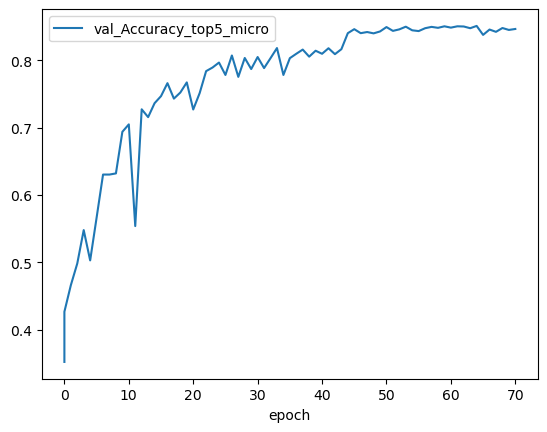

In [43]:
dat_classifier.dropna(subset=["val_Accuracy_top5_micro"]).plot("epoch", "val_Accuracy_top5_micro")

# inference with full pipeline! 

In [45]:
from deepscribe2.pipeline import DeepScribePipeline

In [67]:
pipeline = DeepScribePipeline(
    model,
    pfa_data_module.categories_file,
    classifier=classification_model,
    score_thresh=0.4,
)

In [84]:
# if you don't want to train from scratch, download some pretrained checkpoints!
classifier_ckpt_pretrained = "https://ochre.lib.uchicago.edu/deepscribe/classifier_epoch=50-step=2091.ckpt"
detector_ckpt_pretrained = "https://ochre.lib.uchicago.edu/deepscribe/detector_epoch=358-step=88673.ckpt"
!cd {base_dir} && pwd && wget {classifier_ckpt_pretrained}
!cd {base_dir} && pwd && wget {detector_ckpt_pretrained}

/local/ecw/redux_test
--2023-03-01 01:05:03--  https://ochre.lib.uchicago.edu/deepscribe/classifier_epoch=50-step=2091.ckpt
Resolving ochre.lib.uchicago.edu (ochre.lib.uchicago.edu)... 128.135.181.16
Connecting to ochre.lib.uchicago.edu (ochre.lib.uchicago.edu)|128.135.181.16|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 286031735 (273M)
Saving to: ‘classifier_epoch=50-step=2091.ckpt’

classifier_epoch=50 100%[===================>] 272.78M  97.4MB/s    in 2.8s    

2023-03-01 01:05:06 (97.4 MB/s) - ‘classifier_epoch=50-step=2091.ckpt’ saved [286031735/286031735]

/local/ecw/redux_test
--2023-03-01 01:05:06--  https://ochre.lib.uchicago.edu/deepscribe/detector_epoch=358-step=88673.ckpt
Resolving ochre.lib.uchicago.edu (ochre.lib.uchicago.edu)... 128.135.181.16
Connecting to ochre.lib.uchicago.edu (ochre.lib.uchicago.edu)|128.135.181.16|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 258013427 (246M)
Saving to: ‘detector_epoch=358-ste

In [85]:
pipeline = DeepScribePipeline.from_checkpoints(f"{base_dir}/detector_epoch=358-step=88673.ckpt",
                                              pfa_data_module.categories_file,
                                              classifier_ckpt=f"{base_dir}/classifier_epoch=50-step=2091.ckpt",
                                              score_thresh=0.3)

/local/ecw/mambaforge/envs/deepscribe2/lib/python3.10/site-packages/torchvision/models/detection/backbone_utils.py:160: UserWarning: Changing trainable_backbone_layers has not effect if neither pretrained nor pretrained_backbone have been set to True, falling back to trainable_backbone_layers=5 so that all layers are trainable
  warnings.warn(


In [80]:
# create a datamodule with full annotations!
pfa_data_module_full = PFADetectionDataModule(
    output_dir,
    autocrop=True, # this will trim images using the provided boxes. 
    batch_size=4,
    train_xforms=xforms,
    localization_only=False,
)


In [81]:
pfa_data_module_full.setup(stage="test")
test_img, test_targets = next(iter(pfa_data_module_full.test_dataloader()))

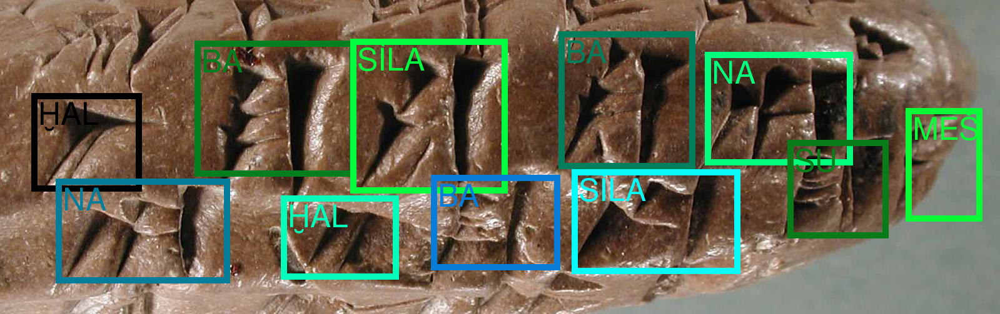

In [83]:
# ground truth boxes from test data
# draw sign classes
gt_signs = signs = [pipeline.class_labels[ind] for ind in test_targets[0]["labels"].tolist()]

rescaled_image = (test_img[0]*255).to(torch.uint8)
F.to_pil_image(draw_bounding_boxes(rescaled_image, 
                                   test_targets[0]["boxes"], 
                                   width=10, 
                                   labels=signs,
                                   font="FreeSans.ttf",
                                  font_size=50))

In [86]:
# run inference! 
preds = pipeline(test_img)

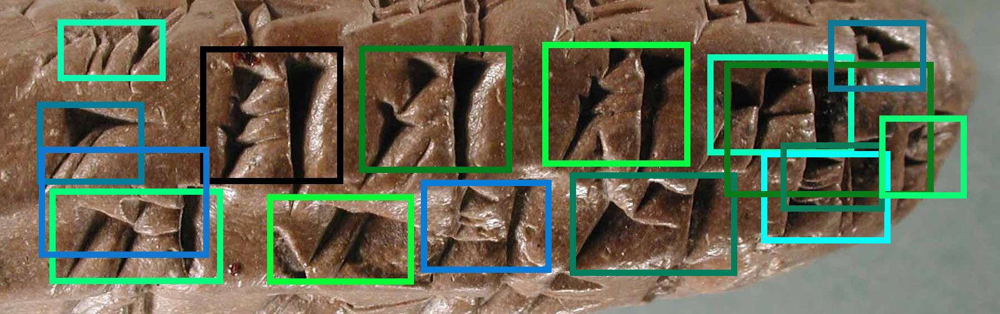

In [87]:
# how does the model do?
F.to_pil_image(draw_bounding_boxes(rescaled_image, 
                                   preds[0]["boxes"], 
                                   width=10, 
                                   # labels=signs,
                                   font="FreeSans.ttf",
                                  font_size=50))

not too bad! some false positives, try playing around with the score_thresh! 
in general, it has some pretty common error modes , note that some signs that it flags as signs were not actually an issue with the model!, they just weren't labeled on the text. it also struggles with some more densely packed areas or edges.

In [77]:
signs = [pipeline.class_labels[ind] for ind in preds[0]["labels"].tolist()]

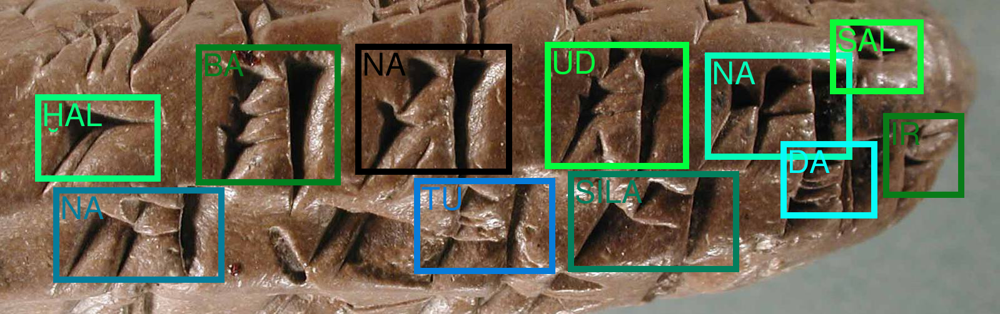

In [79]:
# rendering with end-to-end predictions!
F.to_pil_image(draw_bounding_boxes(rescaled_image, 
                                   preds[0]["boxes"], 
                                   width=10, 
                                   labels=signs,
                                   font="FreeSans.ttf",
                                  font_size=50))